# Analisis del Clima para la Región Frijolera
Por Guillermo Hernandez

Este documento forma parte de los análisis preeliminares para un modelo predictivo de machine learning sobre los precios de principales granos de producción de la región circundante al pueblo de nieves.

En este documento se analiza el clima de la región con mayor producción de frijol del estado de Zacatecas, de las cuales el municipio de fresnillo lidera el puesto, siendo el municipio con mayor producción, según el censo agropecuaro del año 2022 hecho por el INEGI. Los datos son recopilados de manera diaria, y las variables recolectadas son: precipitación (mm), temperatura máxima (ºC), temperatura mínima (ºC), y evaporación (mm).

El análisis consta de 3 partes, y muestra datos en bajo nivel para su fácil interpretación, así como algunos gráficos interactivos:

1. Obtención y preparación de datos.

    Los datos son obtenidos de la base de datos climatólogica de página de la [coordinación general del servicio meteorológico nacional](https://smn.conagua.gob.mx/es/climatologia/informacion-climatologica/normales-climatologicas-por-estado?estado=zac). Naturalmente los datos se encuentran en un formato .txt y es necesario llevarlos a un formato que permita su fácil manejo

2. Datos y distribuciones.
    1. Presenta los datos diaros
    2. Presenta las distribuciones estadísticas de los datos

3. Análisis de precipitaciones
    1. Analísis de precipitación histórica por més
    2. Análisis de precipitación histórica por año

4. Análisis de temperaturas y evaporación
    1. Análisis de temperaturas y evaporación mensual histórico
    2. Análisis de temperaturas y evaporación anual histórico

In [1]:
# importación de librerías
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import calendar
from os import listdir


In [2]:
def read_weather_data(folder:str ='data'):
    name_files = listdir(f'../weather_data/{folder}')
    df = pd.DataFrame()
    for file in name_files:
        place = file[:-4]
        data = pd.read_csv(f'../weather_data/{folder}/{file}', skiprows=25, sep=r'\s+', names =['date',f'rain_{place}',f'evap_{place}',f't_max_{place}',f't_min_{place}'], index_col='date')
        df = pd.concat([df, data], join='outer', axis=1)
    
    df.index = pd.to_datetime(df.index)
    df.dropna(how='all', inplace=True)
    df.replace('NULO', np.nan, inplace=True)
    df.sort_index(inplace=True)
    df = df.astype(float)
    
    return df

In [3]:
data = read_weather_data(folder='daily')

C:\Users\guill\AppData\Local\Temp\ipykernel_20276\1282716328.py:11: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.replace('NULO', np.nan, inplace=True)


In [4]:
data.describe()

,rain_agua_nueva,evap_agua_nueva,t_max_agua_nueva,t_min_agua_nueva,rain_camacho,evap_camacho,t_max_camacho,t_min_camacho,rain_canitas,evap_canitas,...,t_max_sombrerete,t_min_sombrerete,rain_tierra_y_libertad,evap_tierra_y_libertad,t_max_tierra_y_libertad,t_min_tierra_y_libertad,rain_villa_de_cos,evap_villa_de_cos,t_max_villa_de_cos,t_min_villa_de_cos
count,18458.000000,11.000000,18277.000000,18277.000000,20877.000000,21.000000,13194.000000,13194.000000,25813.000000,3127.000000,...,29843.000000,29843.000000,13376.000000,4632.000000,13291.000000,13291.000000,11012.000000,8861.000000,10804.000000,10804.000000
mean,1.008630,4.361818,26.809844,8.860909,0.760421,9.340476,26.997165,9.172813,1.059012,6.857272,...,24.385590,8.676371,1.184607,5.933189,25.850944,7.761568,1.188420,6.138113,26.513190,8.621270
std,4.384347,4.669908,4.865064,4.672833,3.431641,2.521251,5.891723,5.515202,4.331537,2.835225,...,4.573718,4.300445,4.870888,2.809821,4.492149,4.999380,5.210491,2.792587,4.174991,4.846164
min,0.000000,1.000000,-2.000000,-14.000000,0.000000,2.640000,-3.000000,-16.000000,0.000000,0.200000,...,0.800000,-14.400000,0.000000,0.130000,4.500000,-14.000000,0.000000,0.100000,1.000000,-12.000000
25%,0.000000,2.000000,24.000000,6.000000,0.000000,8.210000,23.000000,5.000000,0.000000,4.800000,...,21.800000,5.500000,0.000000,4.100000,23.000000,5.000000,0.000000,4.000000,24.000000,5.000000
50%,0.000000,2.000000,27.000000,10.000000,0.000000,9.040000,28.000000,10.000000,0.000000,6.600000,...,24.500000,9.100000,0.000000,5.230000,26.000000,8.500000,0.000000,5.880000,27.000000,9.500000
75%,0.000000,4.500000,30.000000,12.500000,0.000000,11.320000,31.000000,14.000000,0.000000,8.750000,...,27.500000,12.000000,0.000000,7.600000,29.000000,12.000000,0.000000,8.090000,29.500000,13.000000
max,142.000000,15.980000,40.000000,23.000000,78.000000,15.430000,43.000000,25.000000,87.000000,17.900000,...,39.400000,22.000000,80.000000,17.200000,39.000000,19.000000,100.200000,17.800000,40.000000,19.000000


Para ver que datos se pueden tomar y tener datos promedio usaremos un mapa de correlaciones, o contar los datos faltantes, de aquí obtenemos que los datos de evaporación de agua nueva y camacho no tienen correlación.

In [5]:
total = len(data)
to_drop_columns = []
for col in data.columns:
    number = data[col].count()
    percent = ((total-number)/total)*100
    print(f'Datos en {col}: {number}, Datos faltantes: {total-number}, % faltante = {percent}')
    if percent > 90:
        to_drop_columns.append(col)

Datos en rain_agua_nueva: 18458, Datos faltantes: 18040, % faltante = 49.42736588306209
Datos en evap_agua_nueva: 11, Datos faltantes: 36487, % faltante = 99.96986136226641
Datos en t_max_agua_nueva: 18277, Datos faltantes: 18221, % faltante = 49.92328346758727
Datos en t_min_agua_nueva: 18277, Datos faltantes: 18221, % faltante = 49.92328346758727
Datos en rain_camacho: 20877, Datos faltantes: 15621, % faltante = 42.79960545783331
Datos en evap_camacho: 21, Datos faltantes: 36477, % faltante = 99.94246260069045
Datos en t_max_camacho: 13194, Datos faltantes: 23304, % faltante = 63.850073976656255
Datos en t_min_camacho: 13194, Datos faltantes: 23304, % faltante = 63.850073976656255
Datos en rain_canitas: 25813, Datos faltantes: 10685, % faltante = 29.275576743931175
Datos en evap_canitas: 3127, Datos faltantes: 33371, % faltante = 91.43240725519206
Datos en t_max_canitas: 20458, Datos faltantes: 16040, % faltante = 43.94761356786673
Datos en t_min_canitas: 20458, Datos faltantes: 1604

In [6]:
to_drop_columns

['evap_agua_nueva',
 'evap_camacho',
 'evap_canitas',
 'evap_el_arenal',
 'evap_felipe_angeles',
 'evap_la_colorada',
 'evap_la_honda',
 'evap_presa_santiago',
 'evap_puerto_san_francisco',
 'evap_rancho_grande',
 'evap_sain_alto',
 'evap_san_andres',
 'evap_sierra_vieja']

In [7]:
data.drop(columns=to_drop_columns, inplace=True)

Sin embargo, dado que los datos presentan perdidas que no se suelen solapar, tomaré el promedio de los datos sin distinción

d:\Proyects\Prices_Grain_Zac\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
d:\Proyects\Prices_Grain_Zac\.venv\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


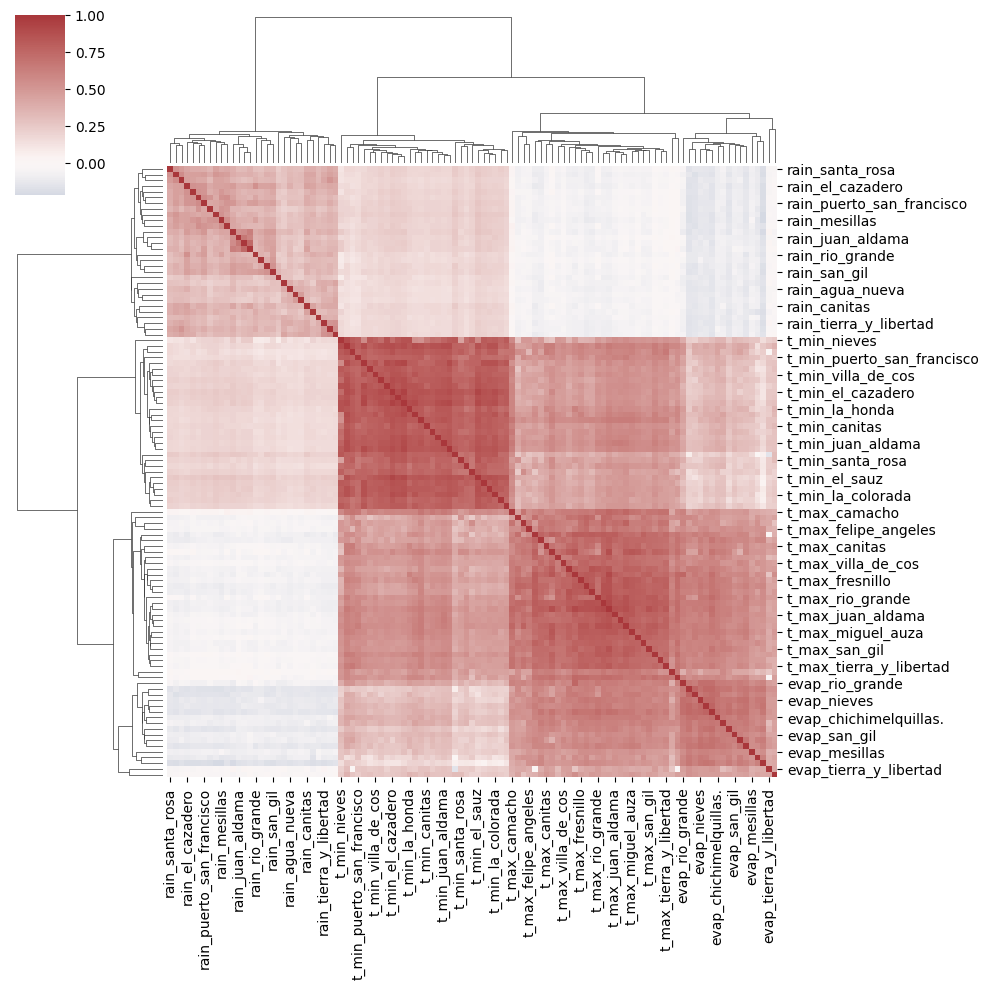

In [8]:
g = sns.clustermap(data.corr().fillna(0), center = 0, cmap = 'vlag')

In [9]:
data['rain'] = data[[col for col in data.columns if 'rain' in col]].mean(axis=1)
data['t_max'] = data[[col for col in data.columns if 't_max' in col]].mean(axis=1)
data['t_min'] = data[[col for col in data.columns if 't_min' in col]].mean(axis=1)
data['evap'] = data[[col for col in data.columns if 'evap' in col]].mean(axis=1)
data_mean = data[['rain','evap','t_max','t_min']].copy()

C:\Users\guill\AppData\Local\Temp\ipykernel_20276\689871490.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data['rain'] = data[[col for col in data.columns if 'rain' in col]].mean(axis=1)
C:\Users\guill\AppData\Local\Temp\ipykernel_20276\689871490.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data['t_max'] = data[[col for col in data.columns if 't_max' in col]].mean(axis=1)
C:\Users\guill\AppData\Local\Temp\ipykernel_20276\689871490.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

In [10]:
data_mean

,rain,evap,t_max,t_min
date,,,,
1921-01-01,0.00,NaN,13.80,5.4
1921-01-02,0.00,NaN,11.80,3.7
1921-01-03,0.00,NaN,14.80,2.4
1921-01-04,0.00,NaN,11.40,4.4
1921-01-05,0.00,NaN,15.60,5.7
...,...,...,...,...
2024-08-27,0.55,6.93,29.75,12.7
2024-08-28,0.00,4.50,28.10,12.6
2024-08-29,0.00,NaN,28.00,12.5


In [11]:
px.line(data_mean)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'variable=rain<br>date=%{x}<br>value=%{y}<extra></extra>',
              'legendgroup': 'rain',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': 'rain',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([datetime.datetime(1921, 1, 1, 0, 0),
                          datetime.datetime(1921, 1, 2, 0, 0),
                          datetime.datetime(1921, 1, 3, 0, 0), ...,
                          datetime.datetime(2024, 8, 29, 0, 0),
                          datetime.datetime(2024, 9, 11, 0, 0),
                          datetime.datetime(2024, 9, 12, 0, 0)], dtype=object),
              'xaxis': 'x',
              'y': array([ 0.,  0.,  0., ...,  0.,  0., nan]),
              'yaxis': 'y'},
             {'hovertemplate': 'variable=evap<br>date=%{x}<br>value=%{y}<extra></extra>',
              'legendgroup': 'evap',
              'line': {'color': '#EF553B', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': 'evap',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([datetime.datetime(1921, 1, 1, 0, 0),
                          datetime.datetime(1921, 1, 2, 0, 0),
                          datetime.datetime(1921, 1, 3, 0, 0), ...,
                          datetime.datetime(2024, 8, 29, 0, 0),
                          datetime.datetime(2024, 9, 11, 0, 0),
                          datetime.datetime(2024, 9, 12, 0, 0)], dtype=object),
              'xaxis': 'x',
              'y': array([nan, nan, nan, ..., nan, nan, nan]),
              'yaxis': 'y'},
             {'hovertemplate': 'variable=t_max<br>date=%{x}<br>value=%{y}<extra></extra>',
              'legendgroup': 't_max',
              'line': {'color': '#00cc96', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': 't_max',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([datetime.datetime(1921, 1, 1, 0, 0),
                          datetime.datetime(1921, 1, 2, 0, 0),
                          datetime.datetime(1921, 1, 3, 0, 0), ...,
                          datetime.datetime(2024, 8, 29, 0, 0),
                          datetime.datetime(2024, 9, 11, 0, 0),
                          datetime.datetime(2024, 9, 12, 0, 0)], dtype=object),
              'xaxis': 'x',
              'y': array([13.8, 11.8, 14.8, ..., 28. ,  nan,  nan]),
              'yaxis': 'y'},
             {'hovertemplate': 'variable=t_min<br>date=%{x}<br>value=%{y}<extra></extra>',
              'legendgroup': 't_min',
              'line': {'color': '#ab63fa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': 't_min',
              'showlegend': True,
              'type': 'scattergl',
              'x': array([datetime.datetime(1921, 1, 1, 0, 0),
                          datetime.datetime(1921, 1, 2, 0, 0),
                          datetime.datetime(1921, 1, 3, 0, 0), ...,
                          datetime.datetime(2024, 8, 29, 0, 0),
                          datetime.datetime(2024, 9, 11, 0, 0),
                          datetime.datetime(2024, 9, 12, 0, 0)], dtype=object),
              'xaxis': 'x',
              'y': array([ 5.4,  3.7,  2.4, ..., 12.5,  nan,  nan]),
              'yaxis': 'y'}],
    'layout': {'legend': {'title': {'text': 'variable'}, 'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'date'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'value'}}}
})

### Distribuciones estadísticas

Dias totales: 36498


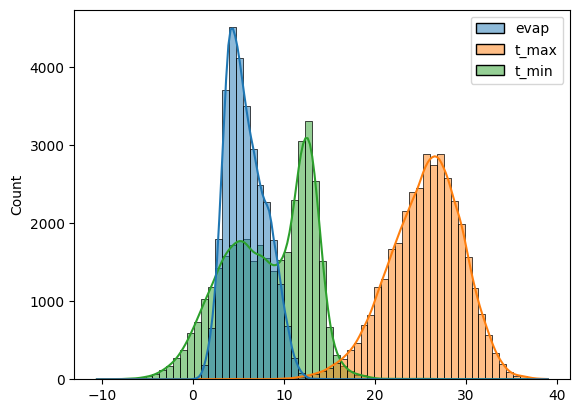

In [12]:
sns.histplot(data[['evap','t_max','t_min']], kde=True)
print('Dias totales:', total)

<Axes: ylabel='Count'>

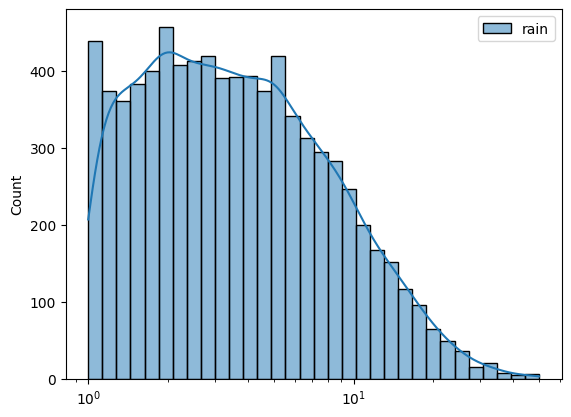

In [13]:
sns.histplot(data[data['rain']>=1].loc[:,['rain']], log_scale=True, kde=True)

In [14]:
# Calculus of days of rain in the year
rain_days = data_mean[data_mean['rain']>=1].loc[:,['rain']].count()
light_rain_days = data_mean[(data_mean['rain']>=1) & (data_mean['rain']<4)].loc[:,['rain']].count()
high_rain_days = data_mean[(data_mean['rain']>=4) & (data_mean['rain']<14)].loc[:,['rain']].count()
anomalous_rain_days = data_mean[data_mean['rain']>=14].loc[:,['rain']].count()

total /= 365
days_of_rain = rain_days/total
days_of_light_rain = light_rain_days/total
days_of_high_rain = high_rain_days/total
days_of_anomalous_rain = anomalous_rain_days/total

print('Años totales:', total)
print(f'Dias promedio de lluvia al año; {days_of_rain}')
print(f'Diaspromedio de lluvia ligera al año: {days_of_light_rain}')
print(f'Dias promedio de lluvia fuerte al año: {days_of_high_rain}')
print('Dias promedio de lluvio inuasualmente alta:', days_of_anomalous_rain)

Años totales: 99.9945205479452
Dias promedio de lluvia al año; rain    80.284399
dtype: float64
Diaspromedio de lluvia ligera al año: rain    45.572497
dtype: float64
Dias promedio de lluvia fuerte al año: rain    29.901638
dtype: float64
Dias promedio de lluvio inuasualmente alta: rain    4.810264
dtype: float64


<Axes: >

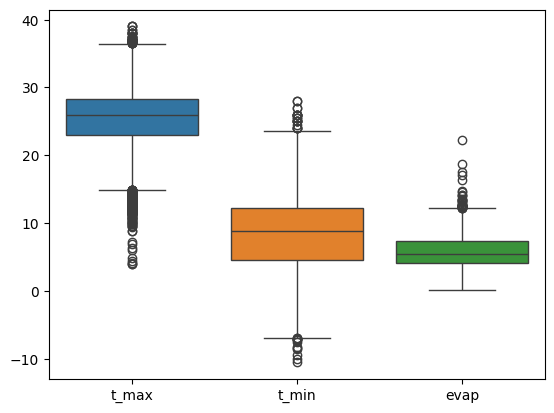

In [15]:
sns.boxplot(data_mean[['t_max','t_min','evap']])

In [16]:
print(data_mean.quantile(0.9))
print(data_mean.quantile(0.1))

rain      3.760348
evap      8.925278
t_max    30.438462
t_min    13.604167
Name: 0.9, dtype: float64
rain      0.000000
evap      3.277333
t_max    20.208333
t_min     1.785185
Name: 0.1, dtype: float64


## Análisis de Precipitaciones

### Análisis de precipitación histórica por mes

#### Preparación de los datos

In [17]:
data_mean['date'] = data_mean.index
data_mean['month'] = data_mean['date'].dt.month
data_mean['year'] = data_mean['date'].dt.year
data_mean.drop(columns='date', inplace=True)

monthly_stats = data_mean.groupby('month')[['rain','evap','t_max','t_min']].agg('mean')
#monthly_stats['rain_ds'] = data_mean.groupby('month')[['rain','evap','t_max','t_min']].agg('std')
# order the months

yearly_stats_sum = data_mean.groupby('year')[['rain','evap','t_max','t_min']].agg('sum')
yearly_stats_mean = data_mean[data_mean['rain']>0].groupby('year')[['rain','evap','t_max','t_min']].agg('mean')
historic_month_stats_sum = data_mean.groupby(['month', 'year'])[['rain','evap','t_max','t_min']].agg('sum')
historic_month_stats_mean = data_mean.groupby(['month', 'year'])[['rain','evap','t_max','t_min']].agg('mean')

In [18]:
# historic_month_stats_mean
historic_month_stats_mean.to_csv('../weather_data/month/historic_month_stats_mean.csv')

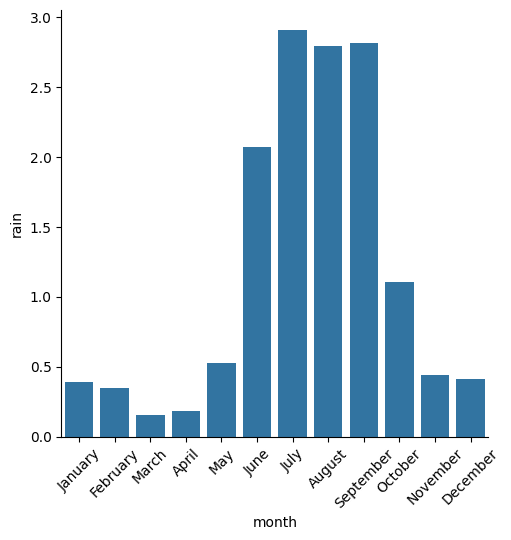

In [18]:
monthly_stats_graph = sns.catplot(monthly_stats, x='month', y='rain', kind='bar')
monthly_stats_graph.set_xticklabels(labels=list(calendar.month_name[1:]),rotation=45)

#### Gráfico Mensual Histórico de precipitaciones promedio

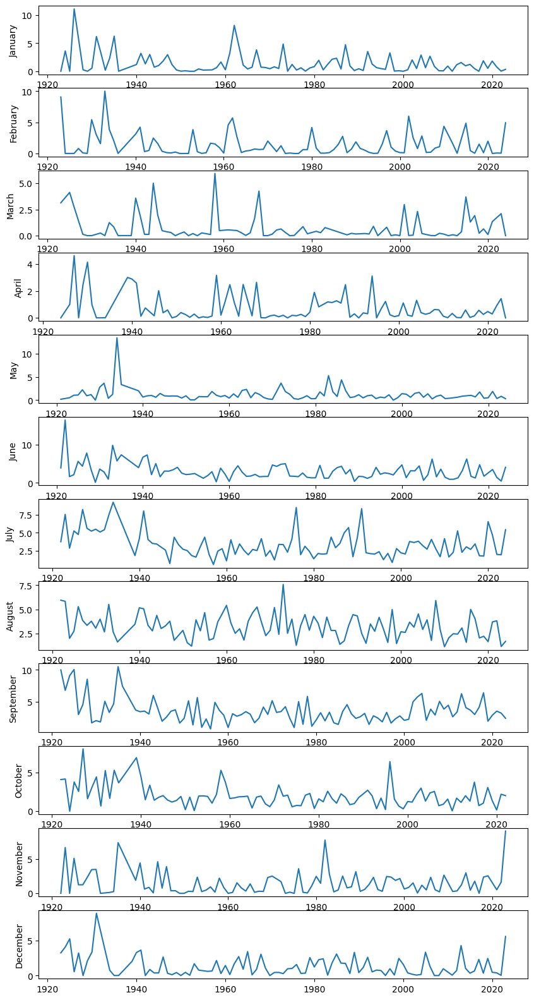

In [19]:
# Promedio
fig, ax = plt.subplots(12,1, figsize = (10,20))
for month in range(1,13):
    ax[month-1].plot(historic_month_stats_mean['rain'].loc[month])
    ax[month-1].set_ylabel(calendar.month_name[1:][month-1])

##### Gráfico Mensual Historico de precipitaciones acumuladas

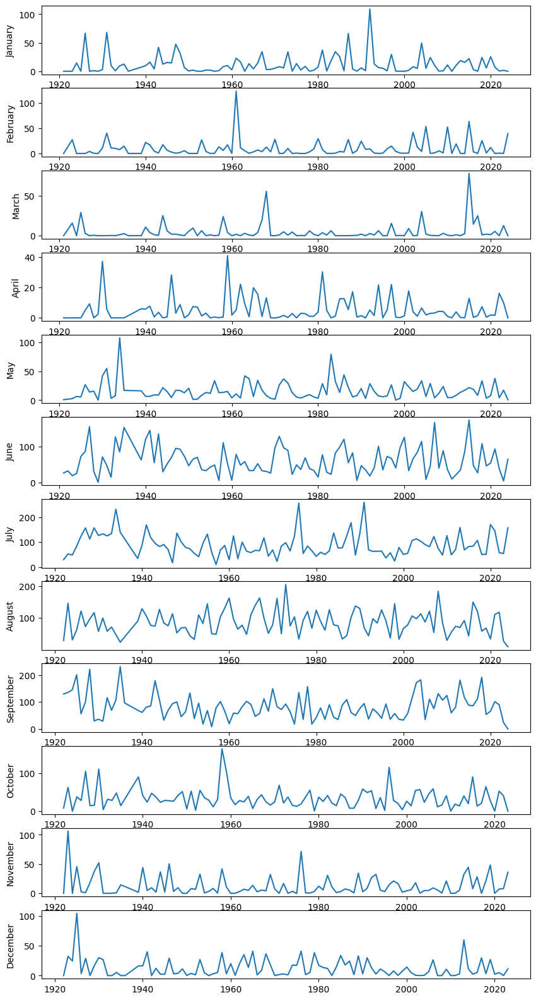

In [20]:
# Promedio
fig, ax = plt.subplots(12,1, figsize = (10,20))
for month in range(1,13):
    ax[month-1].plot(historic_month_stats_sum['rain'].loc[month])
    ax[month-1].set_ylabel(calendar.month_name[1:][month-1])

#### Análisis de precipitación histórica por año

In [21]:
# LLuvia total acumulada
px.line(yearly_stats_sum,y='rain', title='LLuvia total Acumulada por año')

In [22]:
# Lluvia promedio en días de lluvia
px.line(yearly_stats_mean, y='rain', title='Lluvia promedio diaria por año')

In [23]:
df_days_of_rain = data_mean[data_mean['rain']>0].groupby('year').count()
px.line(df_days_of_rain, y='rain', title='Dias de lluvia por año')

## Análisis de Temperaturas y Evaporación

C:\Users\guill\AppData\Local\Temp\ipykernel_27116\1130660323.py:5: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



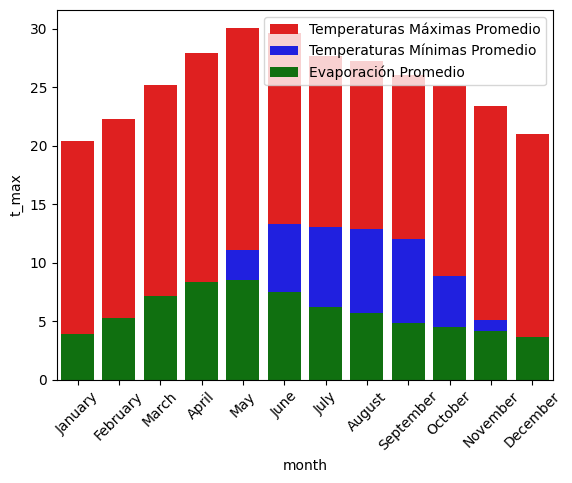

In [24]:
f, axe = plt.subplots()
sns.barplot(monthly_stats, x='month', y='t_max', label = 'Temperaturas Máximas Promedio', color='red', ax = axe)
sns.barplot(monthly_stats, x='month', y='t_min', label = 'Temperaturas Mínimas Promedio', color='blue', ax = axe)
sns.barplot(monthly_stats, x='month', y='evap', label = 'Evaporación Promedio', color = 'green',ax = axe)
tick=axe.set_xticklabels(calendar.month_name[1:], rotation=45)

### Análisis de temperaturas y evaporación mensual histórica

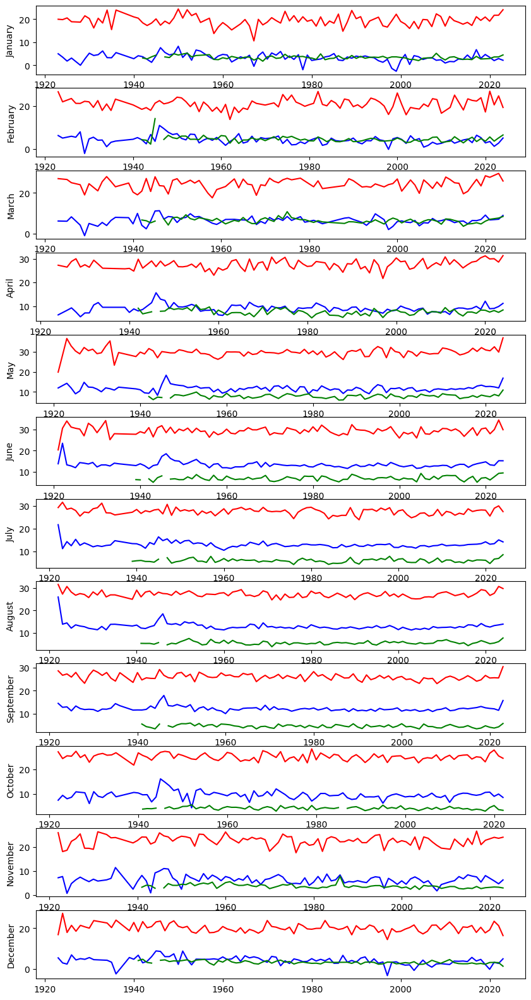

In [25]:
# Promedio
fig, ax = plt.subplots(12,1, figsize = (10,20))
for month in range(1,13):
    ax[month-1].plot(historic_month_stats_mean['t_max'].loc[month], color ='red')
    ax[month-1].plot(historic_month_stats_mean['t_min'].loc[month], color = 'blue')
    ax[month-1].plot(historic_month_stats_mean['evap'].loc[month], color = 'green')
    ax[month-1].set_ylabel(calendar.month_name[1:][month-1])

### Análisis de temperaturas y evaporación anual histórica promedio

In [26]:
# LLuvia total acumulada
px.line(yearly_stats_mean[['t_max','t_min','evap']], title='Temperatura anual promedio y evaporación')

In [ ]:
data_mean.to_csv('../weather_data/zac_region_frij.csv')